In [ ]:
import torch.nn as nn
from torchvision import models, transforms
import torch
from model_architecture import LinearWood

from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

from utils import *

device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [ ]:
# Sample image setup

# path
sample_path = r"Sample image//turtle.jpg"

# Open image, apply transforms: resize image, convert to pytorch tensor
sample = Image.open(sample_path)
copy_sample = sample

tensor_transform = transforms.Compose(transforms= [transforms.Resize((325, 325)), transforms.ToTensor()])
sample_tensor = tensor_transform(sample)

# Unsqeeze to make a batch of 1
sample_tensor_1 = torch.unsqueeze(sample_tensor, 0)
sample_tensor_2 = torch.unsqueeze(sample_tensor, 0)

# Make a batch from a copy by concattenating
sample_tensor = torch.cat(tensors=(sample_tensor_1, sample_tensor_2), dim=0)
print(sample_tensor.shape)


print(sample_tensor.grad)

In [ ]:
# Load the model weights

model_weight_path = r"Models//Experiment_1_2023-11-17_78.pth"
model_weights = torch.load(model_weight_path)

In [ ]:
# Set up the classifier

model = LinearWood()
model.load_state_dict(model_weights)
model.to(device=device)
model.eval

In [ ]:
# layer to get activation
layer = model.conv1
layer_output = []

# Define a hook function -> return model 
def hook_activations(module, input, output):
    layer_output.append(output)

# Hook to the layer
hook = layer.register_forward_hook(hook_activations)

# Forward pass
sample_tensor = sample_tensor.to(device=device)
sample_tensor.requires_grad_(True)
output = model.forward(sample_tensor)

#unhook
hook.remove()

print(layer_output[0].shape)

In [ ]:
# MSE loss
x = layer_output[0]
y = torch.zeros_like(x)

# Mse loss
mse_loss = nn.MSELoss()

# Get loss
loss = mse_loss(x, y)

loss.backward()

grad = sample_tensor.grad.data

print(grad.shape)

In [ ]:
# Convert to numpy array

np_array = grad.cpu().numpy()[0]

# Move channels to the back for numpy
np_array = np_array.transpose(1, 2, 0)

# Print output in not scientific notation
np.set_printoptions(suppress=True)

# Scale the values from [-1..1] to [0..255]
np_array = ((np_array * 1000) + 1) / 2
print(np_array)

img = plt.imshow(np_array)

In [ ]:
def array_to_tensor(array):

    # Transpose np array
    sample = array.transpose(2, 0, 1)

    # convert np_array to torch_tensor
    tensor = torch.from_numpy(sample)

    # Unsqeeze to make a batch of 1
    batch_tensor_1 = torch.unsqueeze(tensor, 0)
    batch_tensor_2 = torch.unsqueeze(tensor, 0)

    batch_tensor = torch.cat(tensors=(batch_tensor_1, batch_tensor_2))

    return batch_tensor

In [ ]:
# prediction = model(input)
# activation = prediction.conv1
# print(activation)

1.857874 -1.4680294


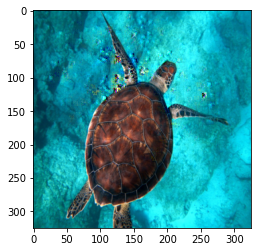

0.031918064 -0.022386782


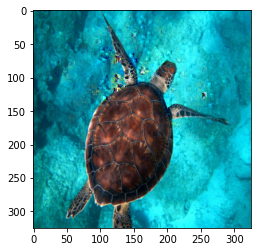

0.016477332 -0.026430488


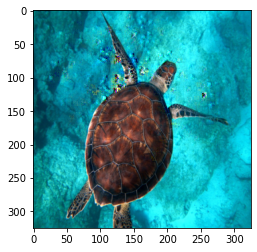

0.20800404 -0.31487954


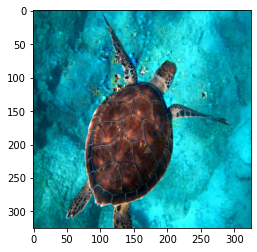

0.009855034 -0.009123128


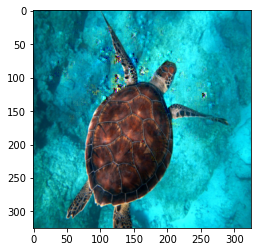

0.8479923 -0.91134036


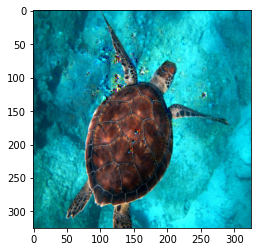

0.058586366 -0.036522258


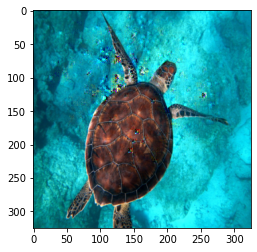

0.008403056 -0.0064885146


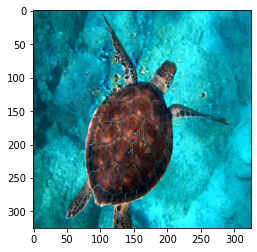

0.03405408 -0.032622952


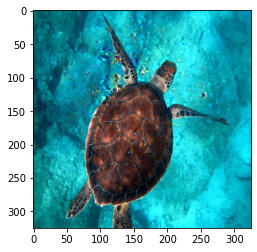

0.0013344034 -0.00092216895


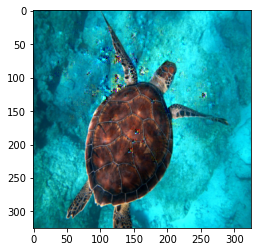

0.1971263 -0.18618612


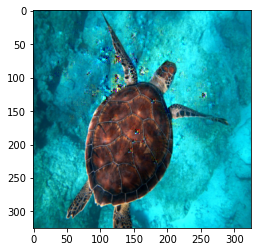

0.002029709 -0.0024476124


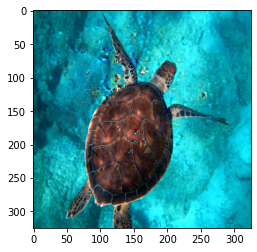

0.072365835 -0.042334747


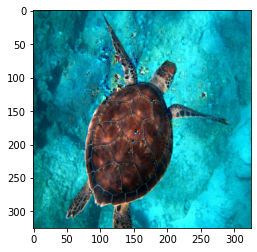

0.07857826 -0.118445374


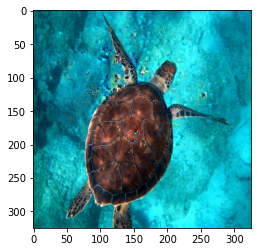

0.14444211 -0.13750155


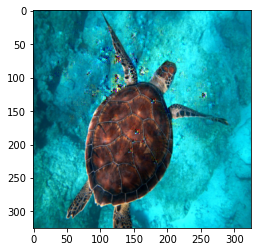

0.10067004 -0.061991595


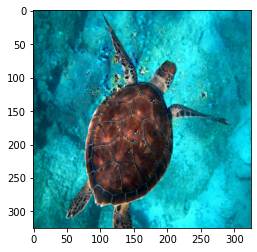

0.0012046157 -0.0007400853


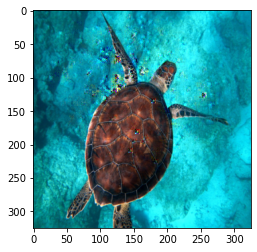

0.011207217 -0.017517118


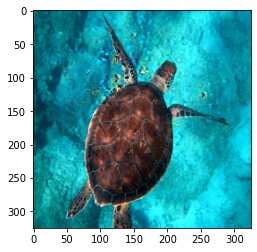

8.985862e-05 -0.00010475983


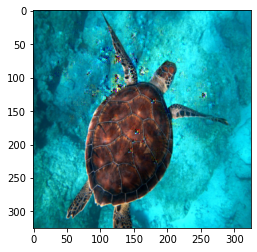

0.079265006 -0.056762803


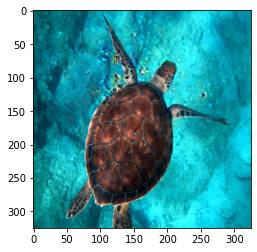

0.09028556 -0.15219808


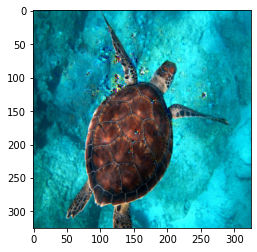

4.325821 -7.091532


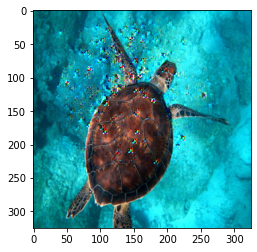

0.00026157676 -0.00034386804


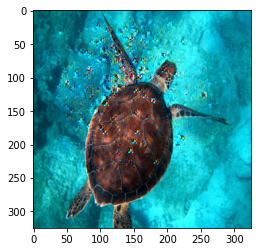

0.19089659 -0.1167765


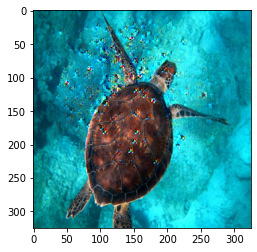

0.11869142 -0.16357201


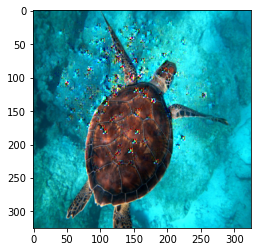

0.012164891 -0.0153999515


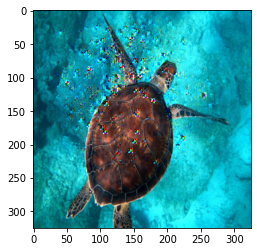

0.11785656 -0.11346464


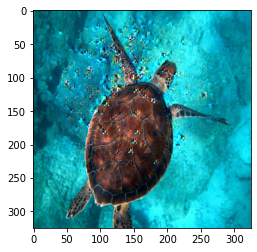

0.030503774 -0.029900229


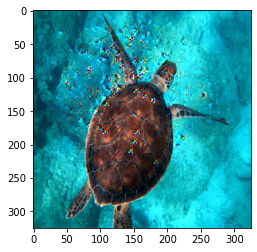

0.06754809 -0.079313055


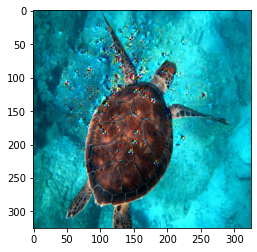

0.026485343 -0.02697381


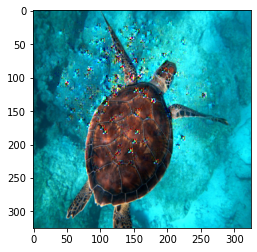

0.095677815 -0.11070738


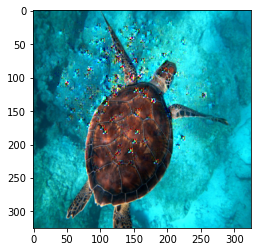

0.00061429106 -0.00039423868


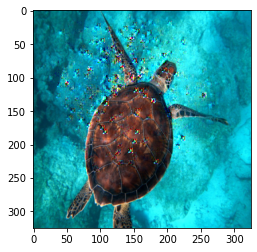

0.00027534066 -0.00030502854


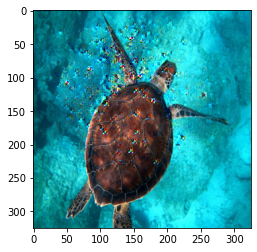

0.5882271 -0.598541


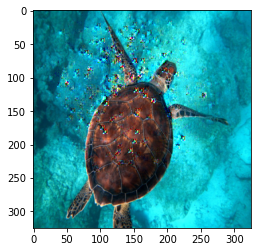

0.0028845037 -0.0034179778


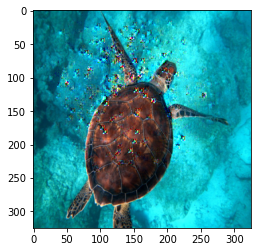

0.18584105 -0.12897637


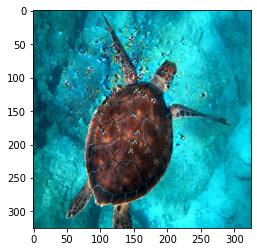

0.82903934 -0.48661783


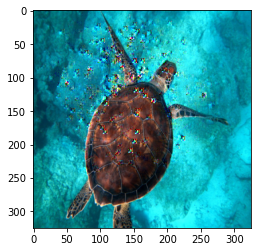

0.0569975 -0.03953025


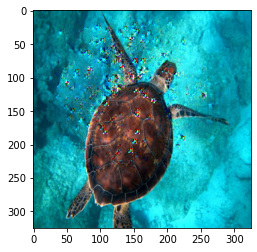

1.4174129 -0.81904167


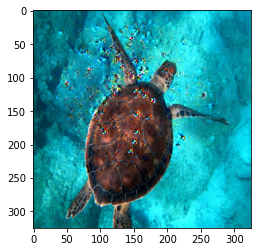

0.0025639809 -0.0017508845


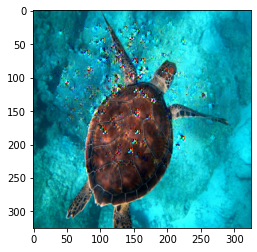

0.026834125 -0.04134916


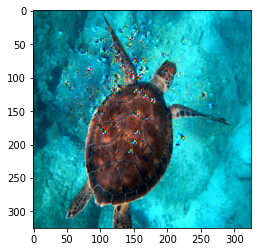

0.21277067 -0.15224639


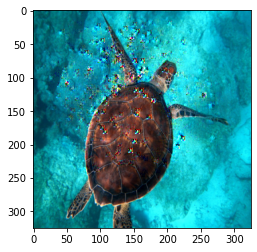

0.005786625 -0.0042977515


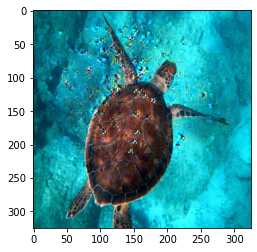

0.017946417 -0.017144652


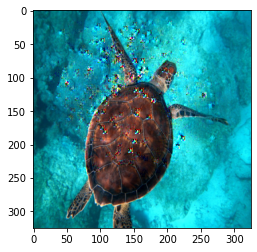

0.0014729619 -0.0023286457


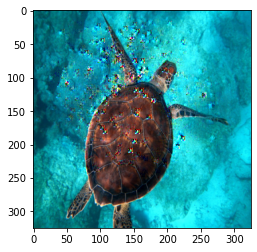

0.00020514717 -0.00022029283


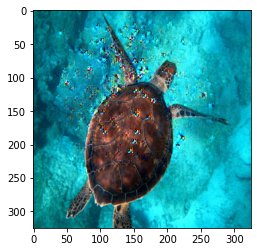

0.0050005494 -0.0062983674


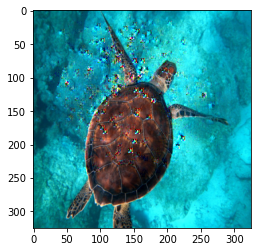

0.30949926 -0.18357605


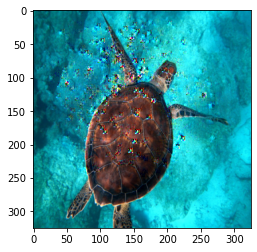

0.21382341 -0.3184526


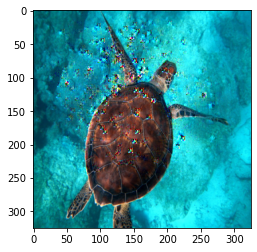

0.01262304 -0.010109807


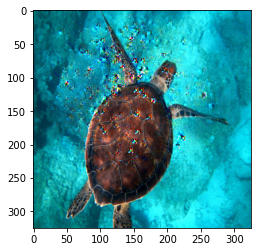

0.0060604783 -0.009155188


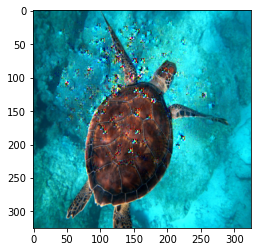

0.017948184 -0.014220161


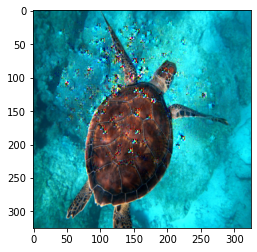

0.24068724 -0.32067233


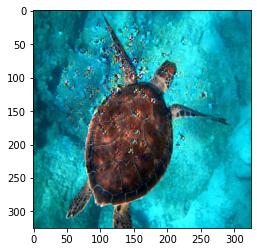

0.2528909 -0.16104595


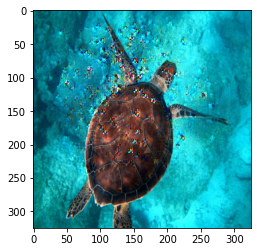

0.2614523 -0.30985144


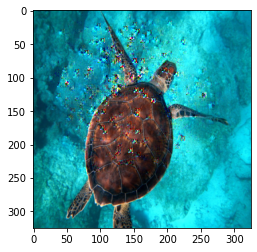

0.018547464 -0.01955254


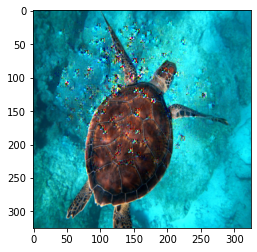

0.008166109 -0.0068472773


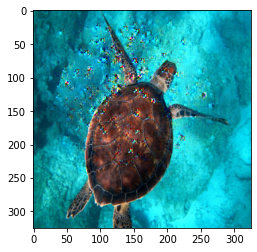

0.05599217 -0.066593565


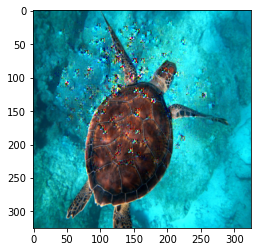

0.07751179 -0.11474737


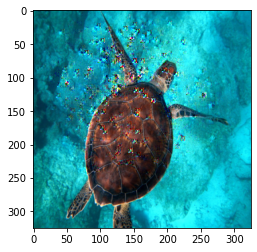

0.12838075 -0.16537724


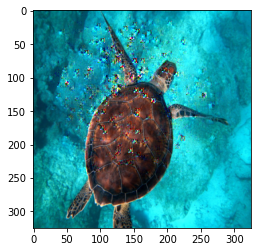

0.010699479 -0.008483471


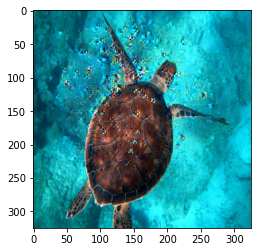

0.0009579311 -0.0011999519


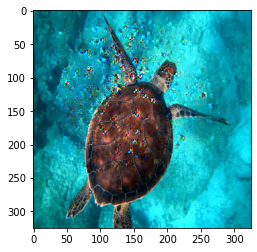

0.11233833 -0.08096359


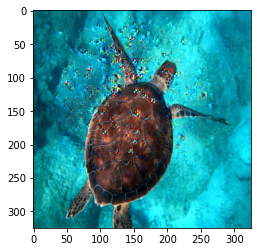

0.14761657 -0.1084143


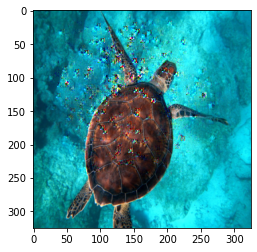

0.07245534 -0.050923273


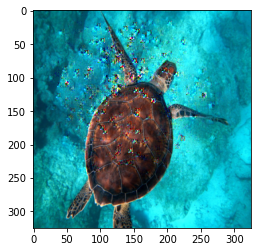

0.003071063 -0.0040225913


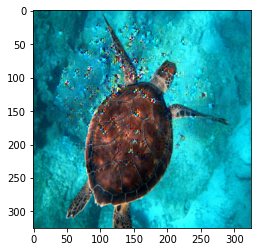

0.0020904124 -0.0019907313


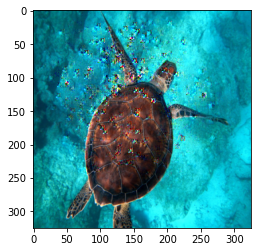

0.0015053174 -0.001636939


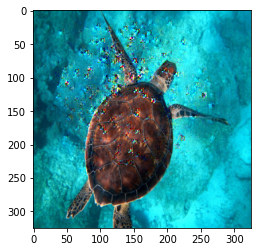

0.6831451 -0.4886473


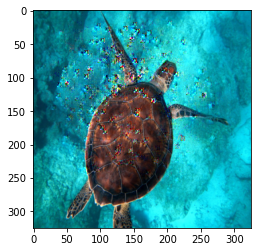

0.0041683433 -0.005245269


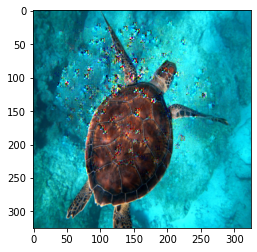

0.19199008 -0.17999905


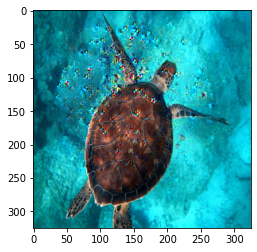

0.0076556625 -0.006026779


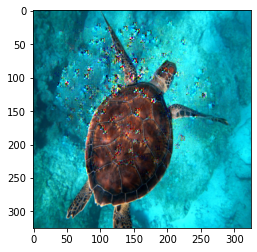

0.013680875 -0.014188698


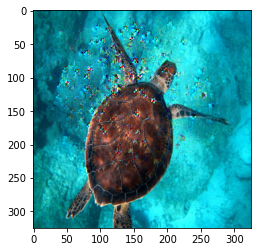

0.102461986 -0.062415026


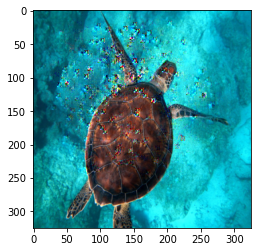

0.009025507 -0.007928375


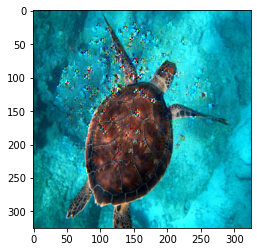

0.075885616 -0.049497627


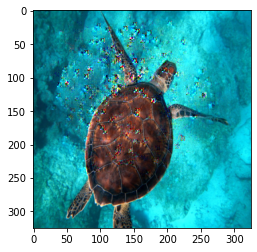

0.09354552 -0.1059022


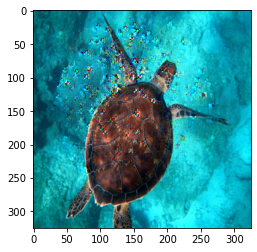

0.0046035326 -0.003269482


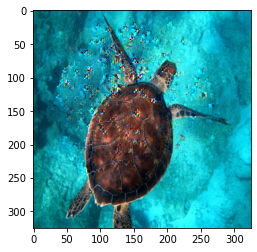

0.021685516 -0.032262977


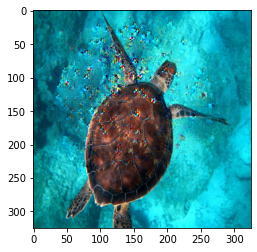

0.629179 -0.5723892


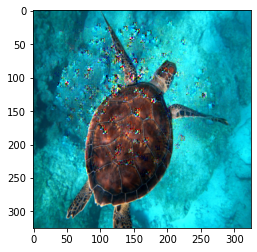

0.86830705 -1.0660379


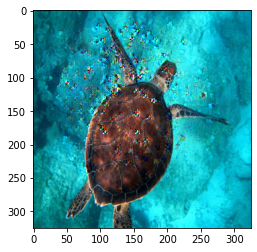

0.05455412 -0.07959632


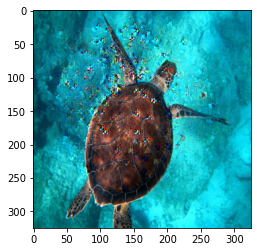

0.08447074 -0.102016956


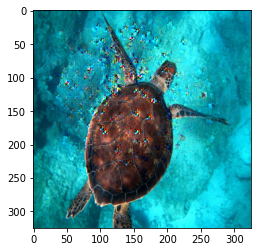

0.010228166 -0.009341139


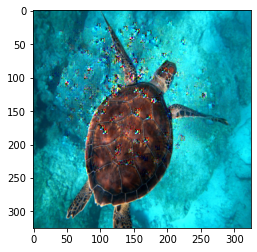

0.007962431 -0.011119036


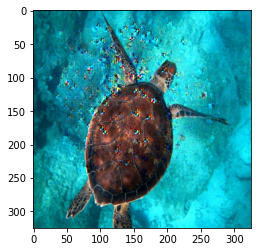

0.11296444 -0.076212324


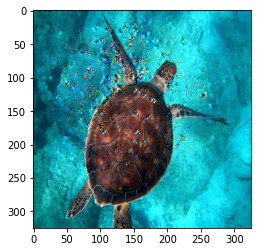

0.31017137 -0.225862


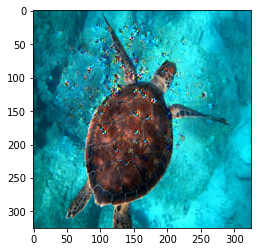

0.047326364 -0.041078873


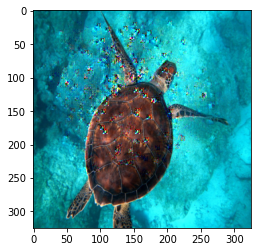

0.0016741342 -0.002264044


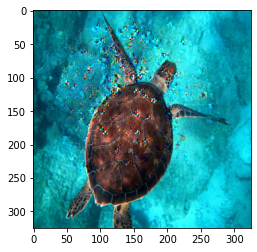

0.0029265059 -0.003750356


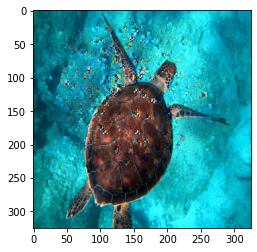

0.00031906905 -0.0002476983


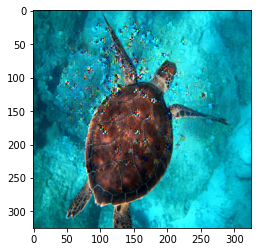

1.2205063 -0.8273869


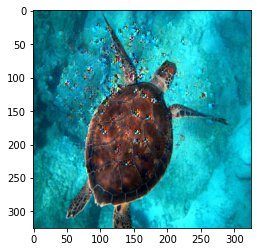

0.014595113 -0.020131815


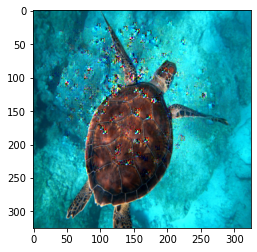

0.048031505 -0.04416976


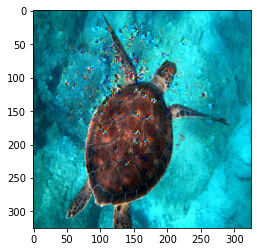

0.5412693 -0.5663788


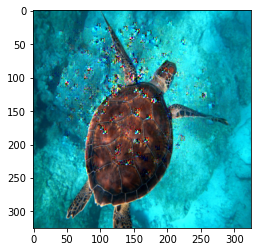

0.020722644 -0.01417847


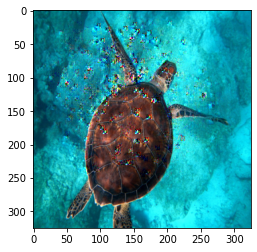

0.004011206 -0.0029961003


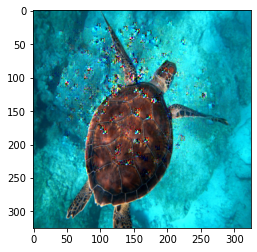

0.027867159 -0.02746112


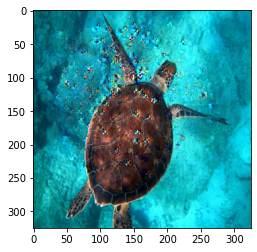

0.061069828 -0.037440114


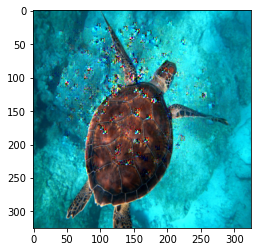

0.015740352 -0.01339845


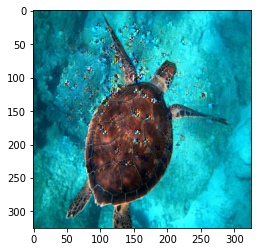

In [15]:
#%matplotlib inline

# Gradient ascent loop

# Get the activation maps from desired layers
layer = model.conv7

# Hook into the model
layer_outputs = []

def hook_function(model, input, output):
    #layer_outputs.append(output)
    hook_function.output = output
    pass

hook = layer.register_forward_hook(hook_function)

# hook.remove()
loss_fn = nn.MSELoss()

def gradient_ascent(start, iter_nr, model, input, loss_fn):

    if start >= iter_nr:
        return
    else:
        # Move input to device
        input = input.to(device=device)

        # Set gradient tracking
        input.requires_grad_(True)

        # Run the model
        prediction = model.forward(input)

        # Retrieve the hook output
        x = hook_function.output
        y = torch.zeros_like(x)

        # Move the hook to the GPU
        x = x.to(device=device)
        y = y.to(device=device)
        
        # Calculate the loss
        loss = loss_fn(x, y)

        # Calculate the gradients
        loss.backward()

        # Get the gradient for the input image
        gradients = input.grad.data

        # Convert the gradients to numpy
        grad_np_array = gradients[0].detach().cpu().numpy()
        grad_np_array = grad_np_array.transpose(1, 2, 0)
        grad_np_array = grad_np_array * 2000 #((grad_np_array * 2000) + 1) / 2
        print(np.max(grad_np_array), np.min(grad_np_array))

        # Add the gradients to the original image
        og_image = input
        og_image_array = og_image[0].detach().cpu().numpy()
        og_image_array = og_image_array.transpose(1, 2, 0)

        updated_image_array = og_image_array + grad_np_array
        updated_image_array = np.clip(updated_image_array, 0, 1)

        # Remap the gradients so they don't add up to a white image

        # Convert the the otput to a batch tensor
        output = array_to_tensor(updated_image_array)

        # Clear the gradients
        input.grad.zero_()

        # Visualise the output
        img = plt.imshow(updated_image_array)
        plt.show()
        
        # set the recursion
        gradient_ascent(start + 1, iter_nr=iter_nr, model=model, input=output, loss_fn=loss_fn)

gradient_ascent(start=0, iter_nr=100, model=model, input=sample_tensor, loss_fn=loss_fn)

# test progressively upscaling the image
# start with 9x9 and then move to 256x256 in 247 steps increasing size by 1 pizel

In [ ]:
#Calculate MSE loss
#Smarter layer implementation